In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sys
import os


module_path = os.path.abspath(os.path.join(os.getcwd(), '..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import plot_config as pc
# import ml_functions as ml

pc.apply_custom_mpl_settings()

<h1><span style="color:orange">Numerical Simulation Laboratory (NSL)</span></h1>

<h2><span style="color:blue"> Keras - Deep & Convolutional Neural Network image recognition </span></h2>

<h2><span style="color:green">Numerical Exercise 12</span></h2>

The objective of Exercise 12 is to design, implement, and compare **Deep Neural Network (DNN)** models to classify handwritten digits from the MNIST dataset.

The dataset consists of 70,000 images, each represented as a $28 \times 28$ pixel grid. Each pixel encodes a grayscale intensity ranging from 0 (white) to 255 (black). Since the goal is to assign each image to one of 10 discrete categories (digits 0-9), this is a fundamental **Classification Task**.

In [ ]:
#import os
#os.environ['KMP_DUPLICATE_LIB_OK']='True' #This is needed in my Anaconda+MacOsX installation; leave it commented.
import tensorflow as tf
from tensorflow import keras
import os
import numpy as np
import matplotlib.pyplot as plt

seed=0
np.random.seed(seed) # fix random seed
tf.random.set_seed(seed)

<h2><span style="color:darkviolet">FFNN Implementation</span></h2>

The image processing, model architecture definition, training, evaluation, and result visualization are implemented through the following functions:

1. `preprocess_mnist_data()` : **Load and preprocess the data**

   - **Reshaping**: Flattens the $28×28$ images matrices into 1D vectors of $784$ elements (Dense layers need 1D input). *Note: This is necessary because standard Dense layers cannot handle 2D spatial structures, resulting in a loss of topological information.*  

   - **Normalization**: Rescales pixel intensities from $[0, 255]$ to the $[0, 1]$ interval. This is crucial for the numerical stability of the optimizer (gradients behave better with small numbers).  

   - **One-Hot Encoding**: Convert integer labels into binary vectors. (e.g., $5 \rightarrow [0,0,0,0,0,1,0,0,0,0]$) to align with the Softmax output layer.  

2. `create_DNN()` : **Architecture Definition**

   - Initializes a `Sequential` model.
   
   - Constructs a deep architecture with 4 Dense layers ($[400, 200, 100, 50]$ neurons).
   
   - Supports multiple activation functions (ReLU, GeLU, ELU, Tanh).
   
   - Includes an optional **Dropout** layer (regularization) to prevent overfitting.
   
   - **Output Layer**: 10 neurons with **Softmax** activation (probability distribution over classes).
   
   - **Compilation**: Uses `categorical_crossentropy` as the loss function and tracks `accuracy`.    

3. `train_model()` : **Model Training**

   - Wraps the `model.fit()` method, handling epochs, batch size, and validation data splitting.    

4. `plot_training_history_and_predictions()` : **Evaluation**

   - Calculates final loss and accuracy on the test set.

   - Plots the learning curves (Loss/Accuracy vs. Epochs).

   - Visualizes sample predictions against ground truth.  

In [ ]:
# LOAD DATA
from keras.datasets import mnist

# input image dimensions
img_rows, img_cols = 28, 28 # number of pixels 
# output
num_classes = 10 # 10 digits

# the data, split between train and test sets
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

print('X_train shape:', X_train.shape)
print('Y_train shape:', Y_train.shape)
 
def preprocess_mnist_data(X_train, Y_train, X_test, Y_test, img_rows=28, img_cols=28, num_classes=10):
    """
    Preprocesses MNIST data for Categorical Crossentropy:
    - Reshapes images to vectors (28x28 -> 784)
    - Casts to float32 and normalizes to [0, 1]
    - Converts labels to one-hot encoding
    """

    # Reshape: images (28x28) to vectors (784,)
    x_train = X_train.reshape(X_train.shape[0], img_rows * img_cols)
    x_test = X_test.reshape(X_test.shape[0], img_rows * img_cols)

    # Cast and Normalize
    x_train = x_train.astype('float32') / 255.0
    x_test = x_test.astype('float32') / 255.0

    # One-hot encoding
    y_train = keras.utils.to_categorical(Y_train, num_classes)
    y_test = keras.utils.to_categorical(Y_test, num_classes)

    print('x_train shape:', x_train.shape)
    print('y_train shape:', y_train.shape)  
    print('x_test shape:', x_test.shape)
    print('y_test shape:', y_test.shape)

    return x_train, y_train, x_test, y_test


# Defines NN Architecture and compiles it
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import SGD, Adam, RMSprop, Adagrad, Adadelta, Adam, Adamax, Nadam

def create_DNN(hidden_neurons, act_func, optimizer, dropout=True):

    # instantiate model
    model = Sequential()

    if len(hidden_neurons) > 0:

        # Input Layer + First Hidden Layer
        model.add(Dense(hidden_neurons[0], input_shape=(img_rows*img_cols,), activation=act_func))
        
        # Subsequent Hidden Layers
        for n_units in hidden_neurons[1:]:
            model.add(Dense(n_units, activation=act_func))

        if dropout:
            # Apply dropout regularization with probability 0.3
            print('Adding dropout with probability 0.3')
            model.add(Dropout(0.3))
            
        # Output Layer
        model.add(Dense(num_classes, activation='softmax'))
        
    else:
        # Simple Logistic Regression case
        model.add(Dense(num_classes, input_shape=(img_rows*img_cols,), activation='softmax'))

    model.compile(loss=keras.losses.categorical_crossentropy,
                  optimizer=optimizer,
                  metrics=['acc'])
    
    print('Model architecture created and compiled successfully!')
    print(f'Structure: Input({img_rows*img_cols}) -> Hidden: {hidden_neurons} -> Output({num_classes})')

    return model


def train_model(model, X_train, Y_train, X_test, Y_test, epochs, batch_size=32):

    history = model.fit(X_train, Y_train,
            batch_size=batch_size,
            epochs=epochs,
            verbose=0,
            validation_data=(X_test, Y_test))

    print('Model trained successfully.')

    return history



def plot_training_history_and_predictions(history, model, X_test, Y_test, img_rows, img_cols, optimizer):

    score = model.evaluate(X_test, Y_test, verbose=1)

    print()
    print('Test loss:', score[0])
    print('Test accuracy:', score[1])

    # Extract metrics safely (handling different Keras versions)
    acc = history.history.get('acc') or history.history.get('accuracy')
    val_acc = history.history.get('val_acc') or history.history.get('val_accuracy')
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)

    # Plot
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Accuracy
    axs[0].plot(epochs, acc, label='Train')
    axs[0].plot(epochs, val_acc, label='Validation')
    axs[0].set_title(f'Model Accuracy-{optimizer}')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend(loc='best')

    # Loss
    axs[1].plot(epochs, loss, label='Train')
    axs[1].plot(epochs, val_loss, label='Validation')
    axs[1].set_title(f'Model Loss-{optimizer}')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend(loc='best')

    plt.tight_layout()
    plt.show()

    # Predictions on X_test
    predictions = model.predict(X_test.reshape(X_test.shape[0], img_rows * img_cols))  # Flatten input se necessario
    X_test_reshaped = X_test.reshape(X_test.shape[0], img_rows, img_cols, 1)

    # Visualize first 10 predictions
    plt.figure(figsize=(20, 5))
    for i in range(10):
        ax = plt.subplot(2, 10, i + 1)
        plt.imshow(X_test_reshaped[i, :, :, 0], cmap='gray')
        plt.title(f"Digit: {np.argmax(Y_test[i])}\nPredicted: {np.argmax(predictions[i])}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

X_train shape: (60000, 28, 28)
Y_train shape: (60000,)


<h2><span style="color:darkviolet">Optimizers and Activation functions used</span></h2>

We tested various configurations combining different optimizers and activation functions.

- **SGD (Stochastic Gradient Descent)**  
  Updates weights using gradients computed on mini-batches; it is simple and robust but may converge slowly without momentum or learning rate tuning.  

- **Adam (Adaptive Moment Estimation)**  
  Combines ideas from Momentum and RMSProp. It usually offers faster convergence and is the default choice for many Deep Learning tasks.  

- **Adagrad (Adaptive Gradient Algorithm)**  
  Adapts the learning rate based on the frequency of parameters features. Good for sparse data, but the learning rate tends to vanish too quickly (saturation).


Activation functions introduce **non-linearity** into the network, allowing it to learn complex patterns (a stack of linear layers is just a single linear layer).

- **ReLU (Rectified Linear Unit)** $$f(x) = \max(0, x)$$  
  **Pros:** Computationally efficient and solves the "vanishing gradient" problem for positive inputs.  
  **Cons:** Suffers from the "Dying ReLU" problem: if a neuron outputs a negative value, its gradient becomes zero, and it stops learning entirely.

- **ELU (Exponential Linear Unit)** $$f(x) = x \text{ if } x > 0, \text{ else } \alpha(e^x - 1)$$  
  **Pros:** Similar to ReLU but allows negative values, pushing the mean activation closer to zero (faster learning) and preventing dead neurons.  
  **Cons:** Computationally more expensive due to the exponential function.

- **GeLU (Gaussian Error Linear Unit)** $$f(x) \approx 0.5x(1 + \tanh(\sqrt{2/\pi}(x + 0.044715x^3)))$$  
  **Pros:** Weights inputs by their magnitude (probability). It is smoother than ReLU and differentiable everywhere.  
  **Cons:** heavy computation.

- **Tanh (Hyperbolic Tangent)** $$f(x) = \tanh(x)$$  
  **Pros:** Zero-centered output range $[-1, 1]$, which helps in centering the data for the next layer.  
  **Cons:** Suffers severely from the **vanishing gradient** problem in deep networks (gradients are near zero for very high or low inputs).

- **Softmax (Output Layer)** $$f(x_i) = \frac{e^{x_i}}{\sum_j e^{x_j}}$$  
  **Function:** Converts raw output scores (logits) into a **probability distribution** summing to 1. Essential for multi-class classification.


In [15]:
# Execute Preprocessing
x_train, y_train, x_test, y_test = preprocess_mnist_data(X_train, Y_train, X_test, Y_test)

models_DNN=[]
histories_DNN=[]

#SGD-RELU
model_DNN_sgd = create_DNN([400,200,100,50], 'relu', SGD())
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#SGD-RELU
model_DNN_sgd = create_DNN([400,200,100,50], 'relu', SGD(), dropout=False)
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#SGD-GELU
model_DNN_sgd = create_DNN([400,200,100,50], 'gelu', SGD())
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#SGD-GELU
model_DNN_sgd = create_DNN([400,200,100,50], 'gelu', SGD(), dropout=False)
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#SGD-ELU
model_DNN_sgd = create_DNN([400,200,100,50], 'elu', SGD())
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#SGD-ELU
model_DNN_sgd = create_DNN([400,200,100,50], 'elu', SGD(), dropout=False)
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#SGD-TANH
model_DNN_sgd = create_DNN([400,200,100,50], 'tanh', SGD())
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#SGD-TANH
model_DNN_sgd = create_DNN([400,200,100,50], 'tanh', SGD(), dropout=False)
history_sgd = train_model(model_DNN_sgd, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_sgd)
histories_DNN.append(history_sgd)

#ADAM-RELU
model_DNN_adam = create_DNN([400,200,100,50], 'relu', Adam(learning_rate=1e-4))
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAM-RELU
model_DNN_adam = create_DNN([400,200,100,50], 'relu', Adam(learning_rate=1e-4), dropout=False)
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAM-GELU
model_DNN_adam = create_DNN([400,200,100,50], 'gelu', Adam(learning_rate=1e-4))
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAM-GELU
model_DNN_adam = create_DNN([400,200,100,50], 'gelu', Adam(learning_rate=1e-4), dropout=False)
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAM-ELU
model_DNN_adam = create_DNN([400,200,100,50], 'elu', Adam(learning_rate=1e-4))
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAM-ELU
model_DNN_adam = create_DNN([400,200,100,50], 'elu', Adam(learning_rate=1e-4), dropout=False)
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAM-TANH
model_DNN_adam = create_DNN([400,200,100,50], 'tanh', Adam(learning_rate=1e-4))
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAM-TANH
model_DNN_adam = create_DNN([400,200,100,50], 'tanh', Adam(learning_rate=1e-4), dropout=False)
history_adam = train_model(model_DNN_adam, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adam)
histories_DNN.append(history_adam)

#ADAGRAD-RELU
model_DNN_adagrad = create_DNN([400,200,100,50], 'relu', Adagrad())
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)

#ADAGRAD-RELU
model_DNN_adagrad = create_DNN([400,200,100,50], 'relu', Adagrad(), dropout=False)
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)

#ADAGRAD-GELU
model_DNN_adagrad = create_DNN([400,200,100,50], 'gelu', Adagrad())
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)

#ADAGRAD-GELU
model_DNN_adagrad = create_DNN([400,200,100,50], 'gelu', Adagrad(), dropout=False)
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)

#ADAGRAD-ELU
model_DNN_adagrad = create_DNN([400,200,100,50], 'elu', Adagrad())
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)

#ADAGRAD-ELU
model_DNN_adagrad = create_DNN([400,200,100,50], 'elu', Adagrad(), dropout=False)
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)

#ADAGRAD-TANH
model_DNN_adagrad = create_DNN([400,200,100,50], 'tanh', Adagrad())
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)

#ADAGRAD-TANH
model_DNN_adagrad = create_DNN([400,200,100,50], 'tanh', Adagrad(), dropout=False)
history_adagrad = train_model(model_DNN_adagrad, x_train, y_train, x_test, y_test, epochs=30, batch_size=32)
models_DNN.append(model_DNN_adagrad)
histories_DNN.append(history_adagrad)


x_train shape: (60000, 784)
y_train shape: (60000, 10)
x_test shape: (10000, 784)
y_test shape: (10000, 10)
Adding dropout with probability 0.5
Model architecture created and compiled successfully!
Structure: Input(784) -> Hidden: [400, 200, 100, 50] -> Output(10)


/Users/tommasocanclini/anaconda3/lib/python3.12/site-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model trained successfully.
Model architecture created and compiled successfully!
Structure: Input(784) -> Hidden: [400, 200, 100, 50] -> Output(10)
Model trained successfully.
Adding dropout with probability 0.5
Model architecture created and compiled successfully!
Structure: Input(784) -> Hidden: [400, 200, 100, 50] -> Output(10)
Model trained successfully.
Model architecture created and compiled successfully!
Structure: Input(784) -> Hidden: [400, 200, 100, 50] -> Output(10)
Model trained successfully.
Adding dropout with probability 0.5
Model architecture created and compiled successfully!
Structure: Input(784) -> Hidden: [400, 200, 100, 50] -> Output(10)
Model trained successfully.
Model architecture created and compiled successfully!
Structure: Input(784) -> Hidden: [400, 200, 100, 50] -> Output(10)
Model trained successfully.
Adding dropout with probability 0.5
Model architecture created and compiled successfully!
Structure: Input(784) -> Hidden: [400, 200, 100, 50] -> Output(10

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - acc: 0.9758 - loss: 0.1219

Test loss: 0.10397474467754364
Test accuracy: 0.9790999889373779


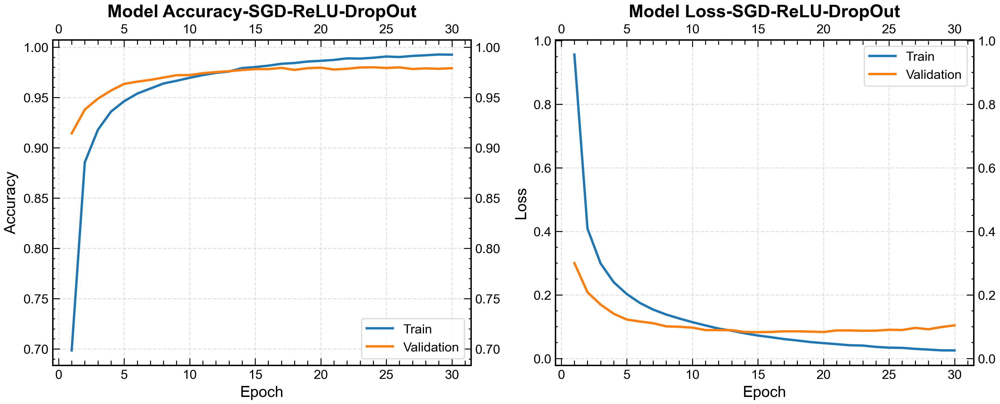

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


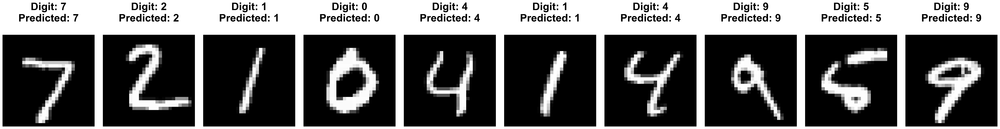

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.9756 - loss: 0.0990

Test loss: 0.08343351632356644
Test accuracy: 0.9793000221252441


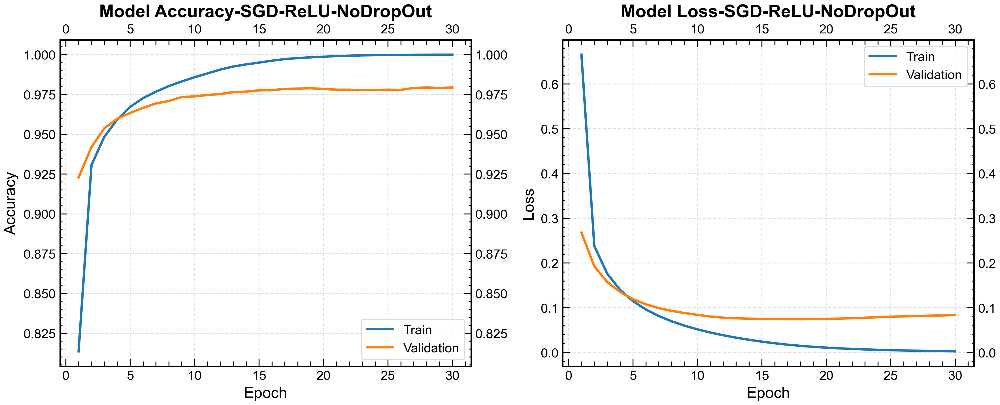

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


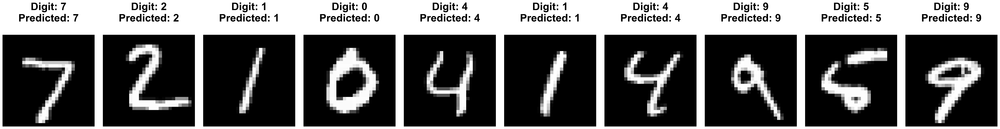

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9763 - loss: 0.0877

Test loss: 0.07447465509176254
Test accuracy: 0.9797999858856201


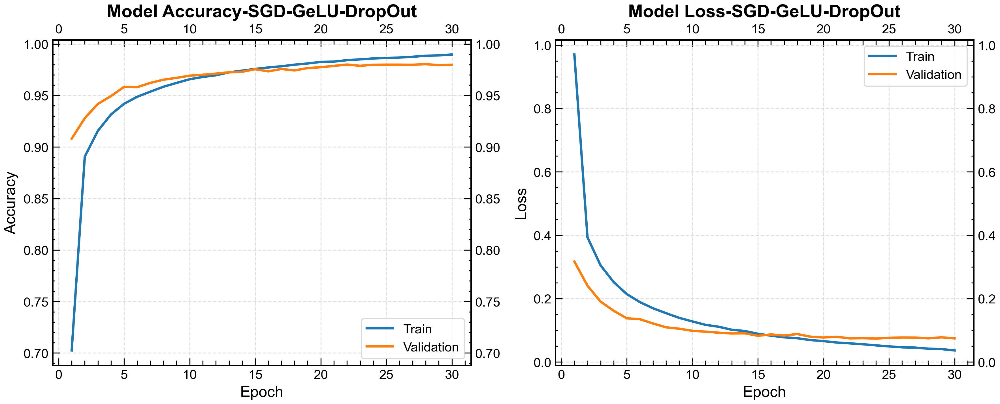

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


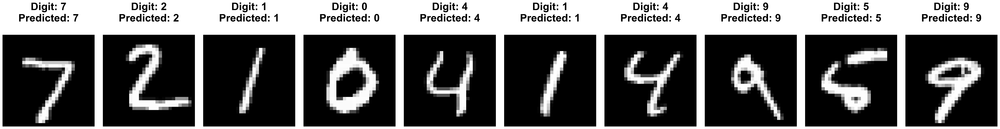

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.9749 - loss: 0.1052

Test loss: 0.08856619894504547
Test accuracy: 0.9771000146865845


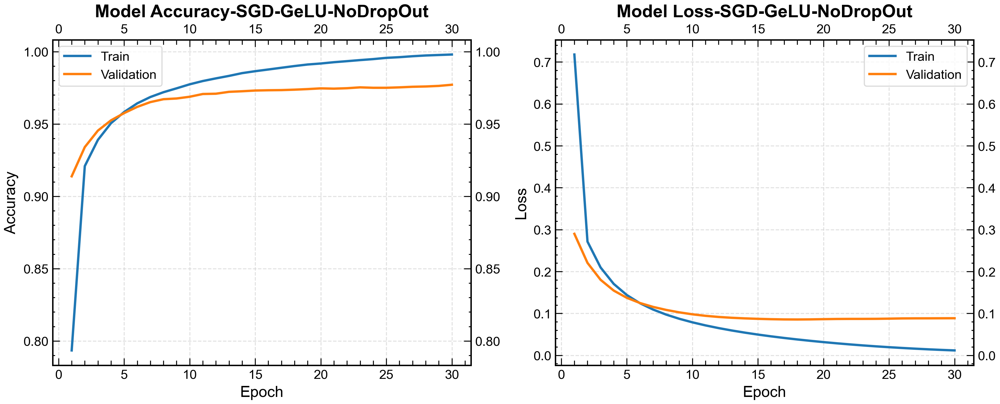

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


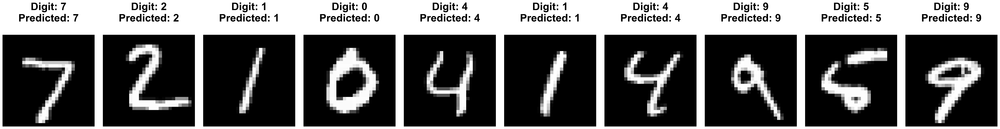

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - acc: 0.9758 - loss: 0.0801

Test loss: 0.06834416836500168
Test accuracy: 0.9793000221252441


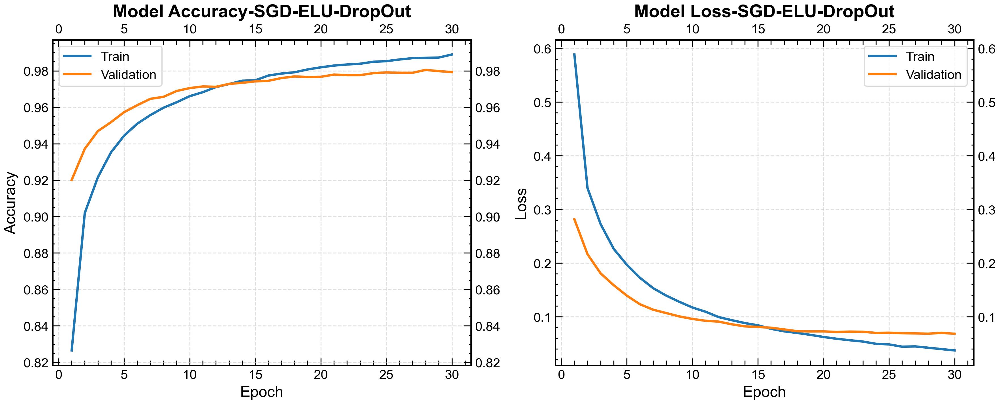

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


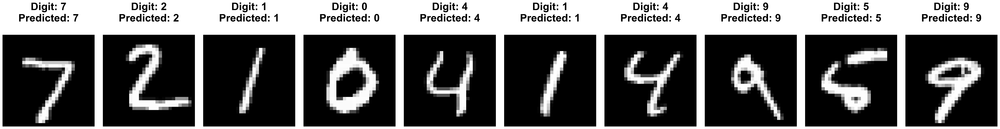

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9739 - loss: 0.0894

Test loss: 0.07368455082178116
Test accuracy: 0.9779000282287598


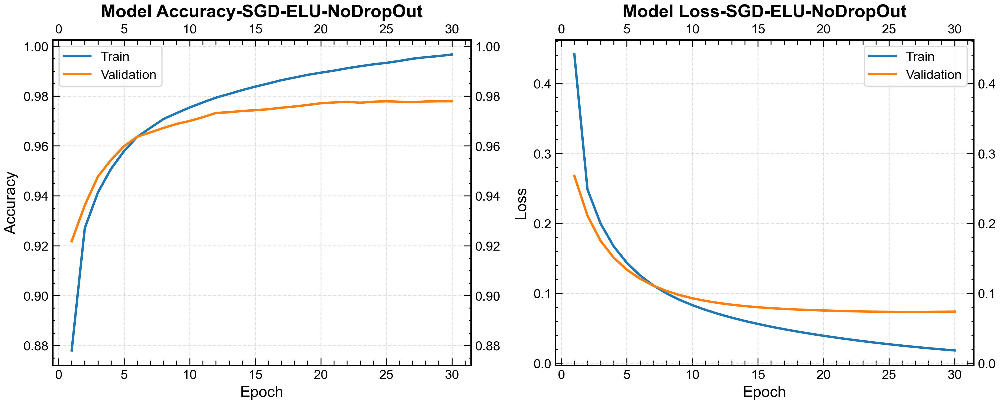

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


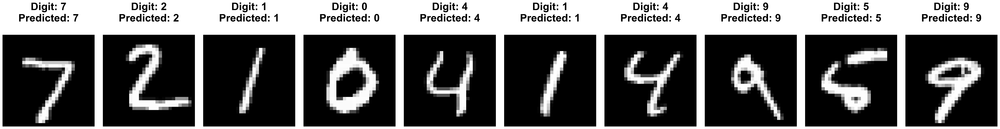

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9752 - loss: 0.0802

Test loss: 0.06920543313026428
Test accuracy: 0.979200005531311


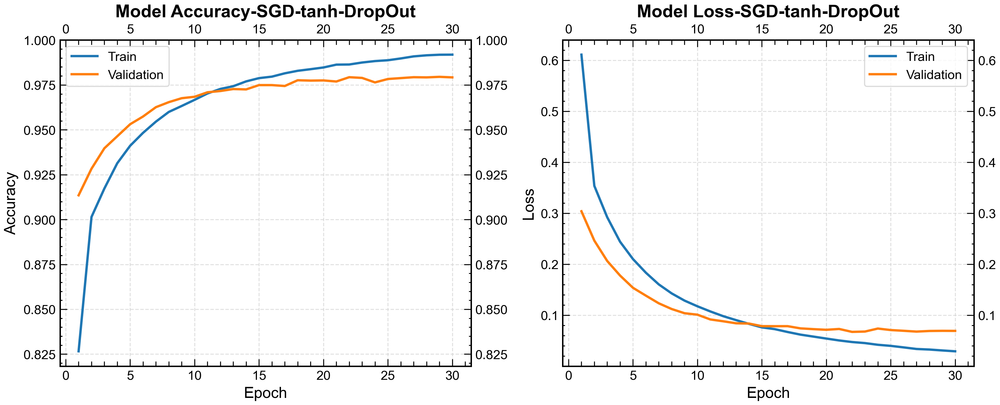

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


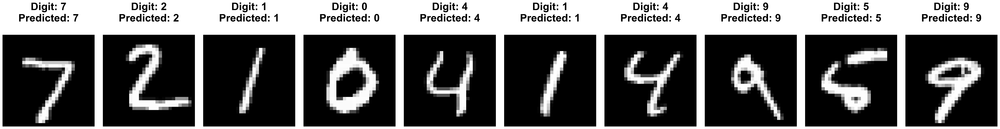

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9736 - loss: 0.0821

Test loss: 0.0680447369813919
Test accuracy: 0.978600025177002


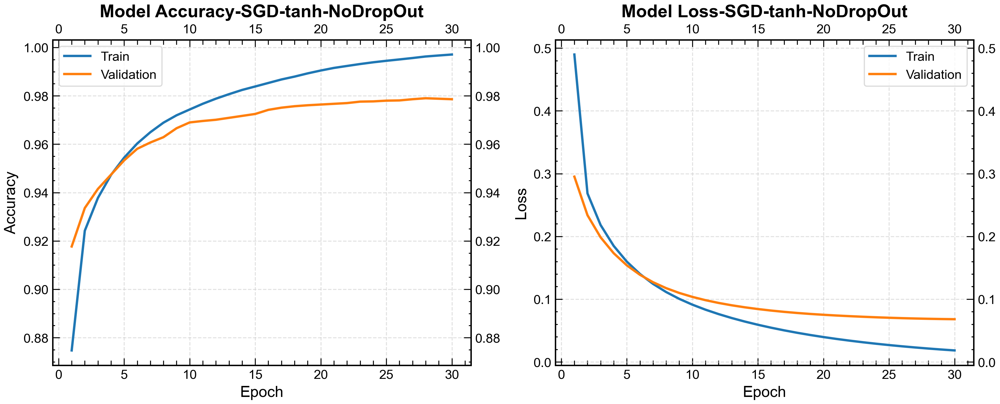

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


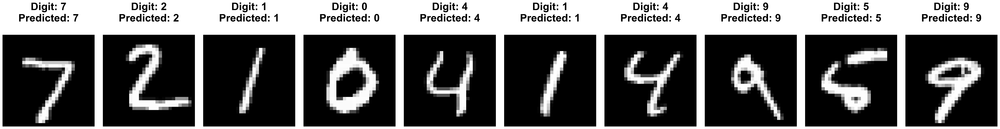

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9765 - loss: 0.1566

Test loss: 0.12952668964862823
Test accuracy: 0.9800999760627747


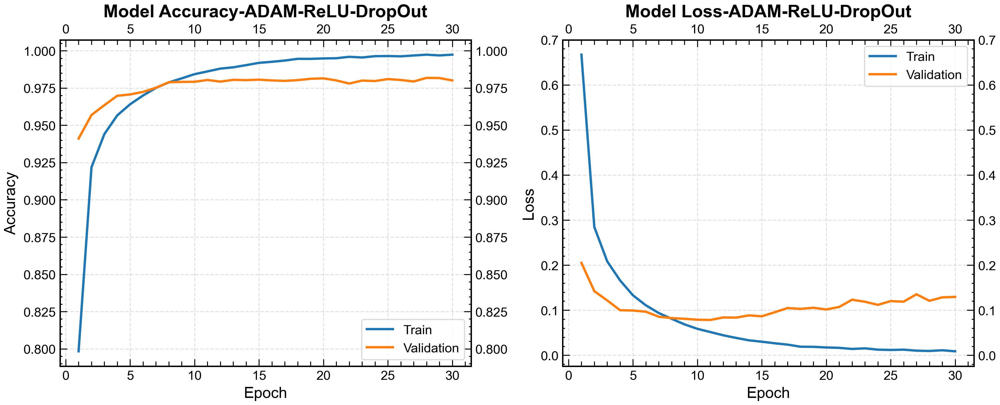

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


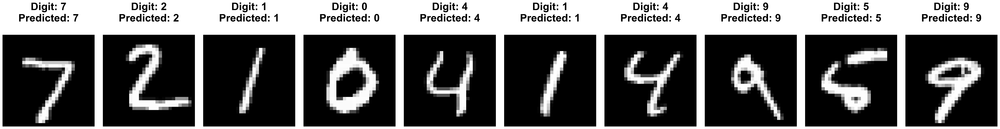

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.9758 - loss: 0.1209

Test loss: 0.09939713776111603
Test accuracy: 0.9797999858856201


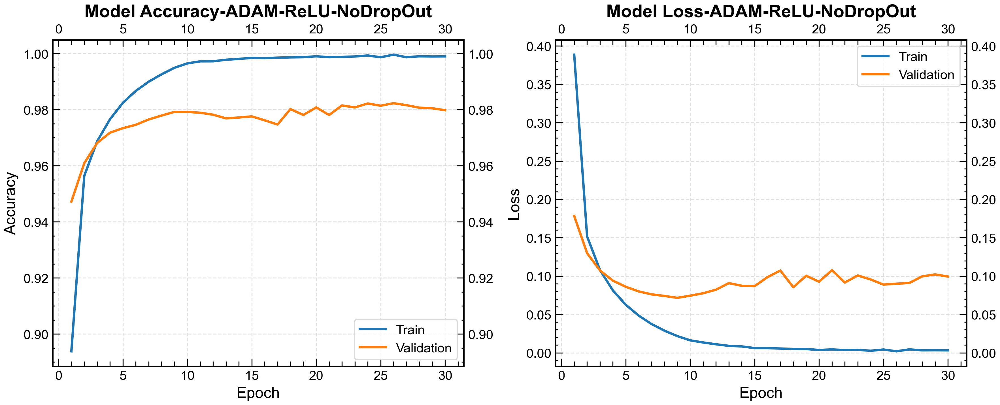

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step


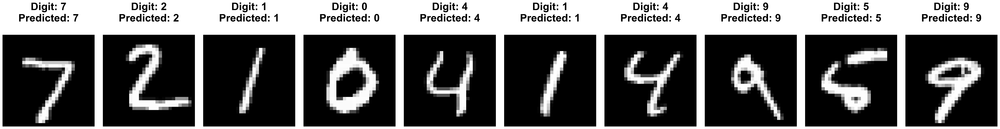

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - acc: 0.9814 - loss: 0.1243

Test loss: 0.0987415611743927
Test accuracy: 0.9846000075340271


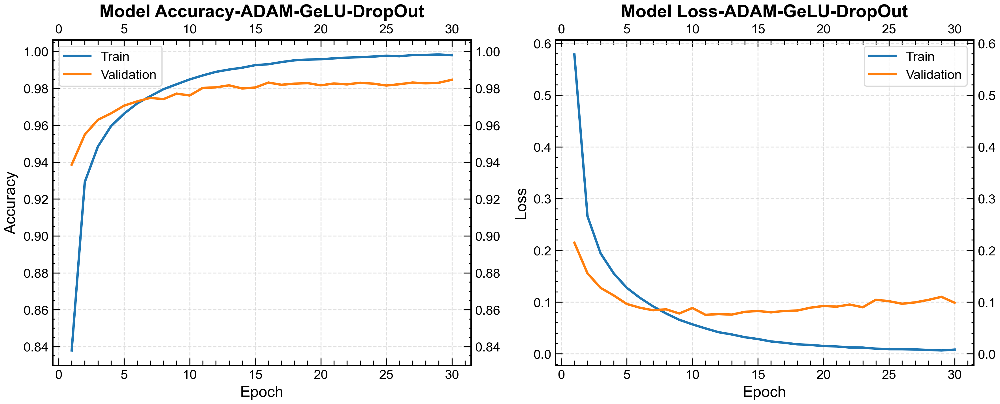

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


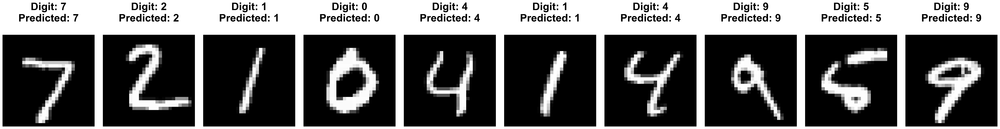

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - acc: 0.9784 - loss: 0.1143

Test loss: 0.09342466294765472
Test accuracy: 0.982200026512146


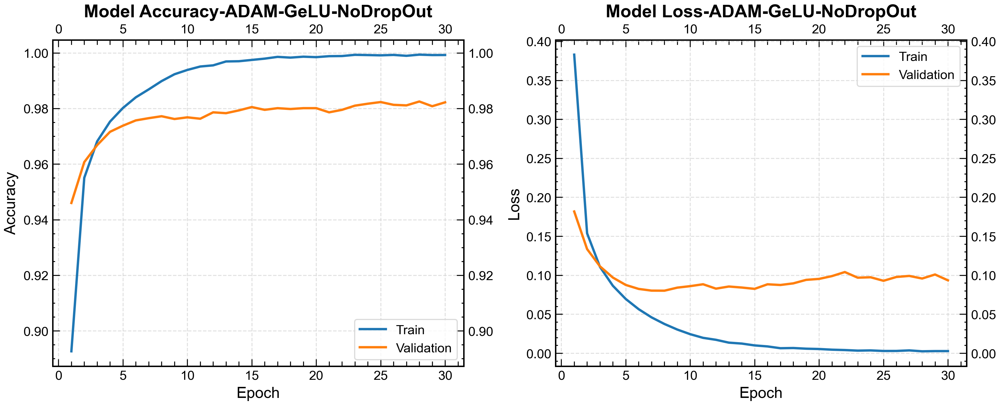

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


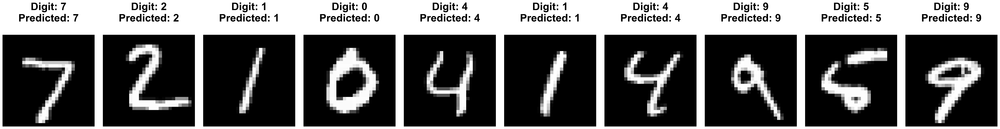

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - acc: 0.9756 - loss: 0.1090

Test loss: 0.0953289270401001
Test accuracy: 0.9785000085830688


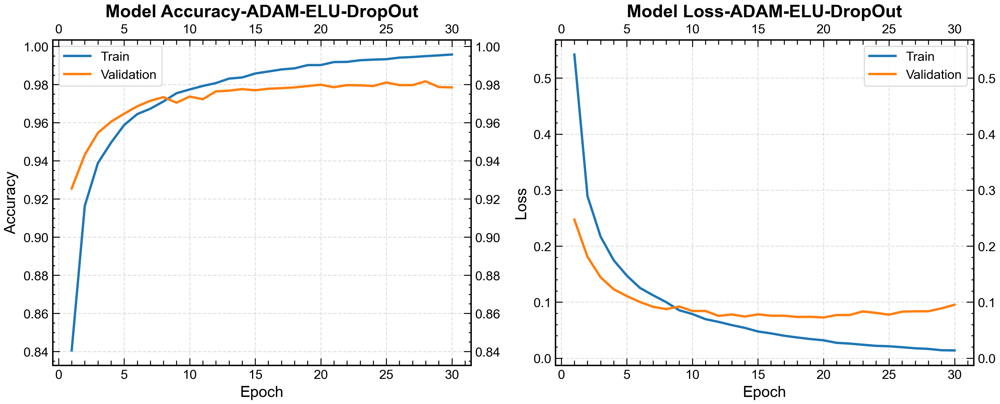

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


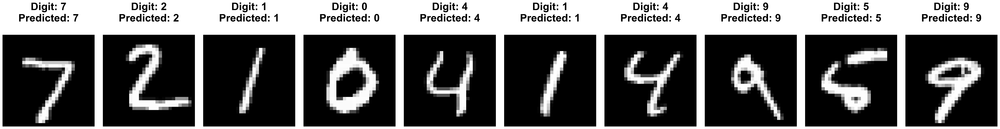

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.9746 - loss: 0.1421

Test loss: 0.12596073746681213
Test accuracy: 0.9763000011444092


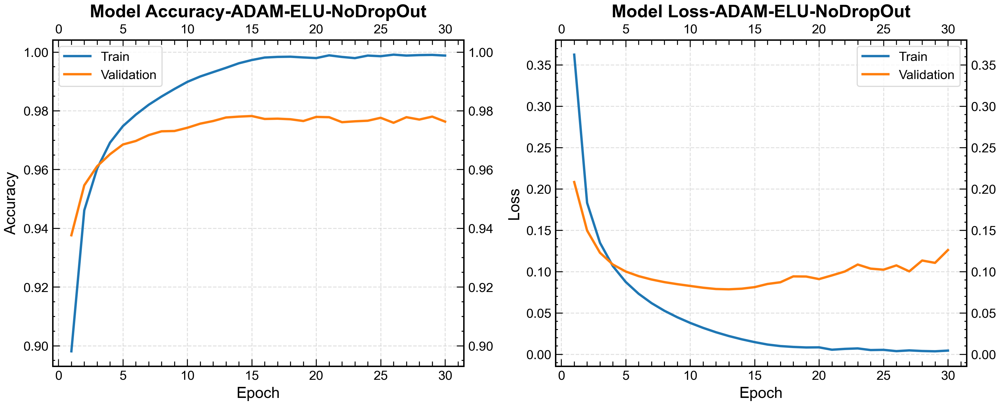

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


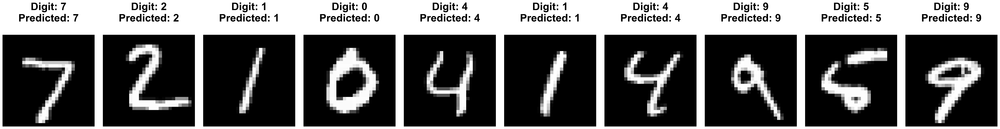

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - acc: 0.9765 - loss: 0.1041

Test loss: 0.08786115050315857
Test accuracy: 0.9810000061988831


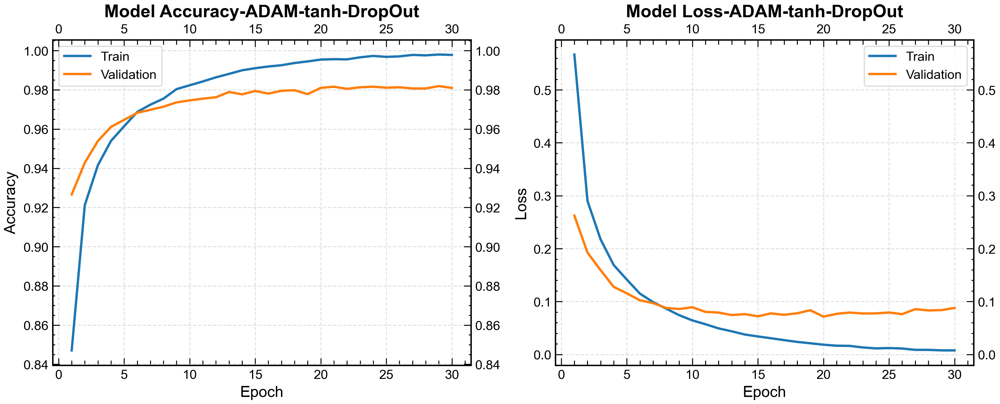

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


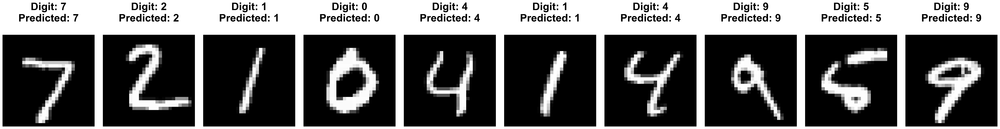

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.9755 - loss: 0.1233

Test loss: 0.10850876569747925
Test accuracy: 0.9779999852180481


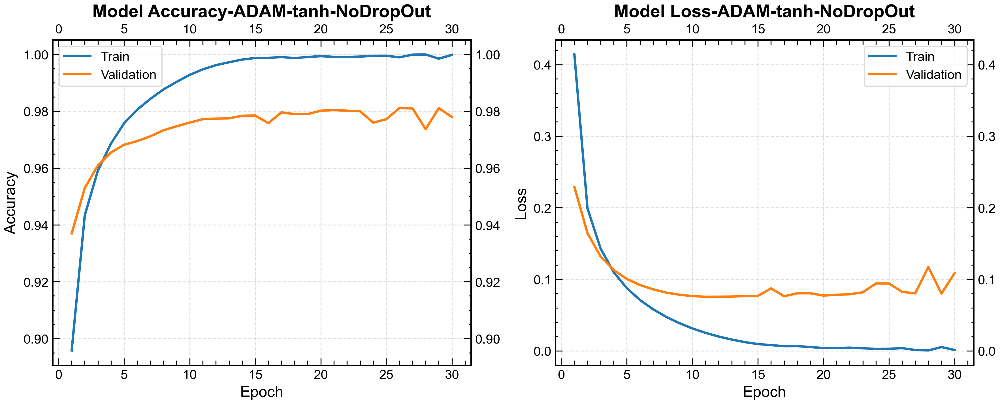

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


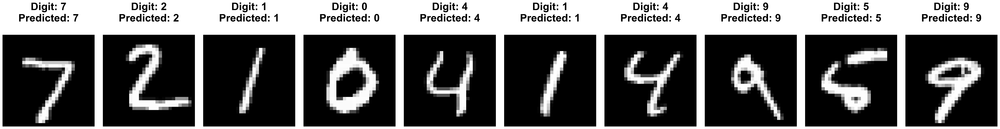

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9516 - loss: 0.1632

Test loss: 0.14106853306293488
Test accuracy: 0.9589999914169312


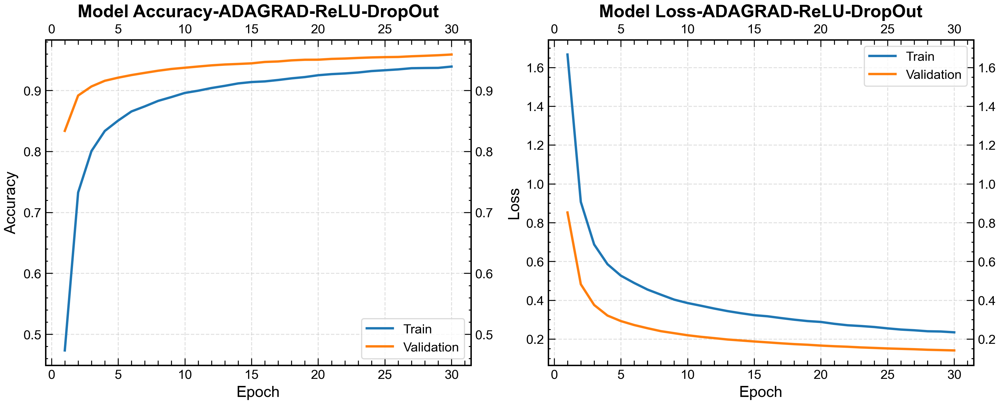

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


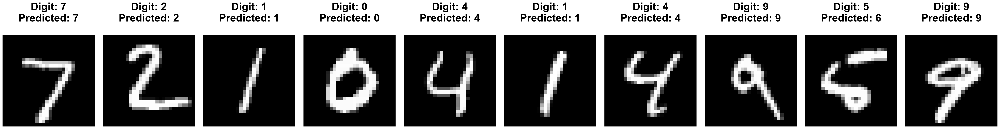

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9559 - loss: 0.1434

Test loss: 0.12287149578332901
Test accuracy: 0.9629999995231628


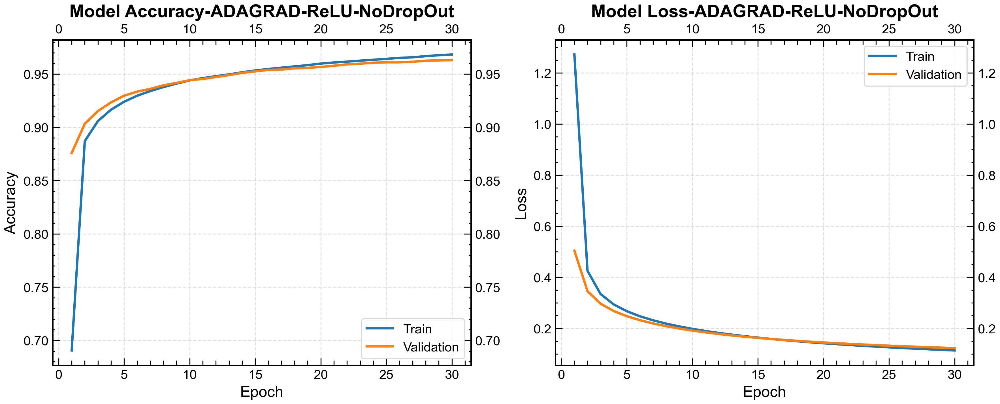

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


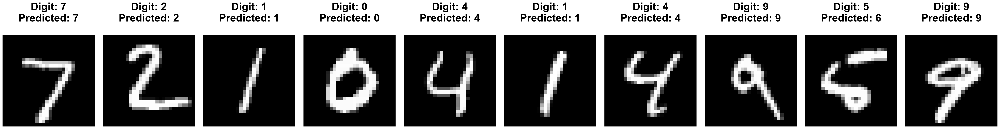

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9415 - loss: 0.1874

Test loss: 0.1590103656053543
Test accuracy: 0.9514999985694885


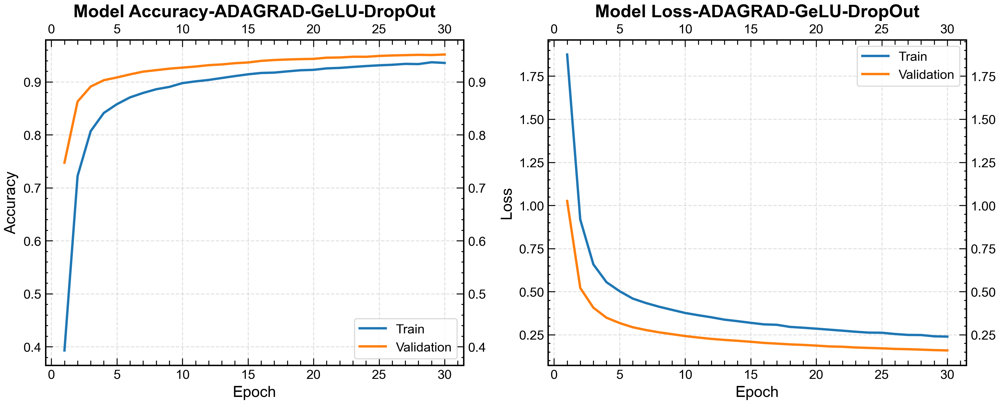

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


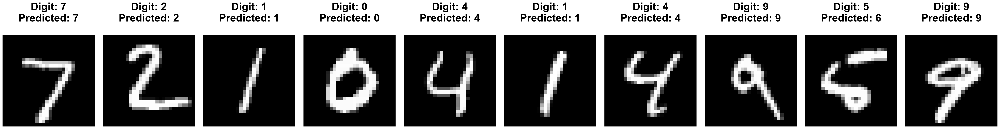

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - acc: 0.9541 - loss: 0.1636

Test loss: 0.13797001540660858
Test accuracy: 0.9605000019073486


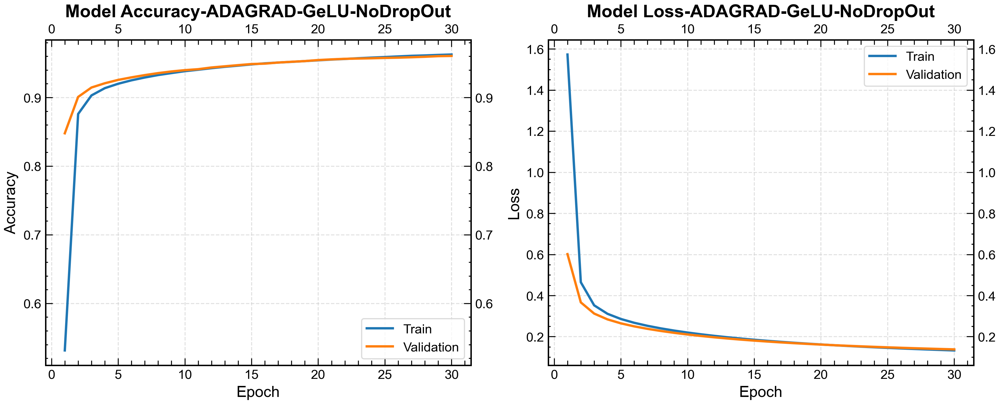

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


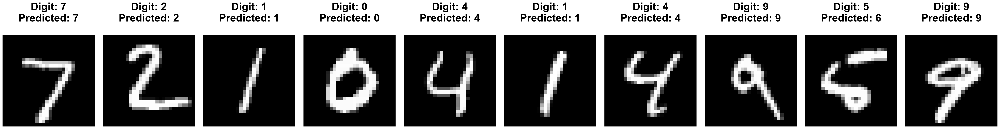

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - acc: 0.9399 - loss: 0.1961

Test loss: 0.17147816717624664
Test accuracy: 0.949400007724762


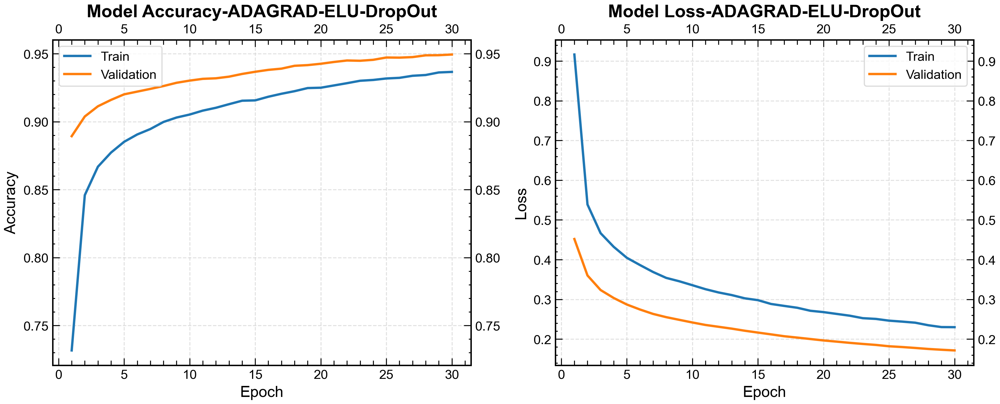

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


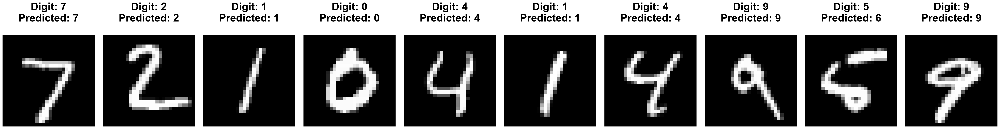

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.9433 - loss: 0.1822

Test loss: 0.15606443583965302
Test accuracy: 0.9527000188827515


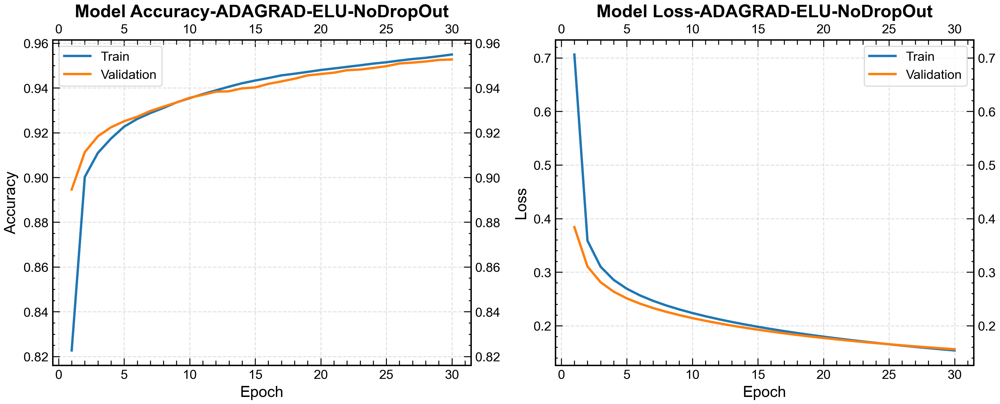

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


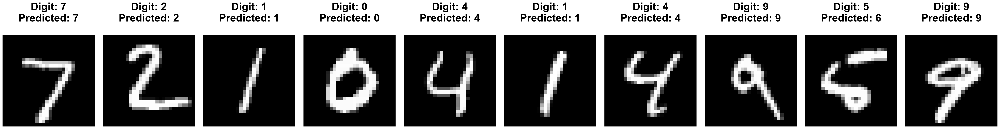

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - acc: 0.9402 - loss: 0.2004

Test loss: 0.17557670176029205
Test accuracy: 0.9488999843597412


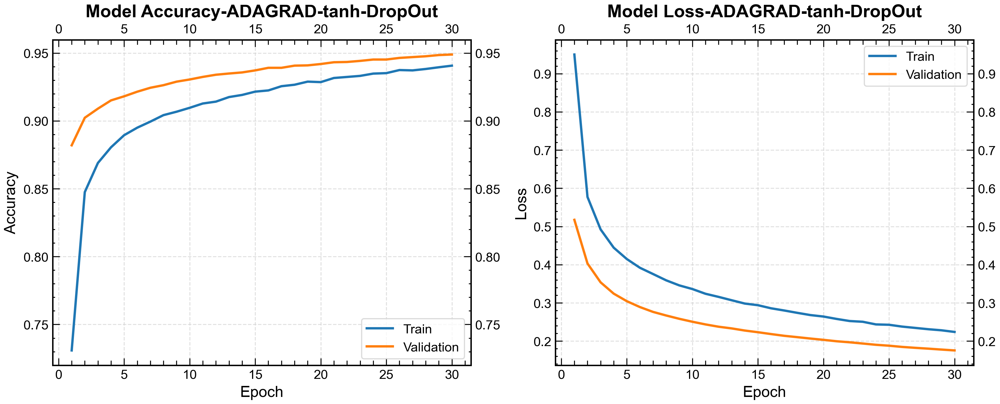

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


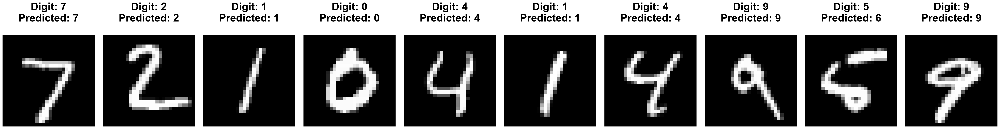

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - acc: 0.9401 - loss: 0.1938

Test loss: 0.16812779009342194
Test accuracy: 0.9502999782562256


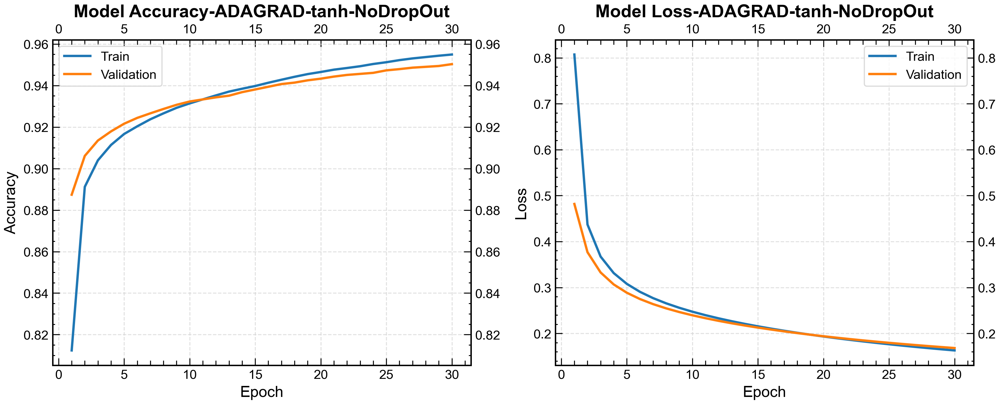

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


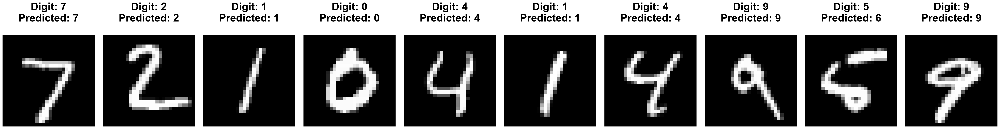

In [18]:
optimizers=['SGD-ReLU-DropOut','SGD-ReLU-NoDropOut','SGD-GeLU-DropOut','SGD-GeLU-NoDropOut','SGD-ELU-DropOut','SGD-ELU-NoDropOut','SGD-tanh-DropOut','SGD-tanh-NoDropOut',
            'ADAM-ReLU-DropOut','ADAM-ReLU-NoDropOut','ADAM-GeLU-DropOut','ADAM-GeLU-NoDropOut','ADAM-ELU-DropOut','ADAM-ELU-NoDropOut','ADAM-tanh-DropOut','ADAM-tanh-NoDropOut',
            'ADAGRAD-ReLU-DropOut','ADAGRAD-ReLU-NoDropOut','ADAGRAD-GeLU-DropOut','ADAGRAD-GeLU-NoDropOut','ADAGRAD-ELU-DropOut','ADAGRAD-ELU-NoDropOut','ADAGRAD-tanh-DropOut','ADAGRAD-tanh-NoDropOut']

for model,history,opt in zip(models_DNN,histories_DNN,optimizers):
    plot_training_history_and_predictions(history, model, x_test, y_test, img_rows, img_cols, opt)

The performance of the Deep Neural Network (DNN) was evaluated across various configurations, focusing on the interplay between optimization algorithms and activation functions.

1. **Optimizer Dynamics: SGD, Adam, and Adagrad**

- **Adam (Adaptive Moment Estimation)**: This optimizer demonstrated the highest efficiency, achieving rapid convergence within approximately **7 epochs**. Its success is attributed to the computation of adaptive learning rates for each parameter, which effectively navigates the high-dimensional loss landscape of the MNIST dataset. It proved robust enough to correctly classify ambiguous inputs, such as distorted handwritten '5's.

- **Stochastic Gradient Descent (SGD)**: SGD exhibited a steady, albeit slower, convergence compared to Adam, typically requiring **15–20 epochs** to stabilize. A characteristic "crossing" of the learning curves was observed: initially, **Validation Accuracy > Training Accuracy**. This is a direct result of **Dropout regularization**, which injects noise only during training; since SGD learns gradually, this gap persists until the model compensates for the added training difficulty.

- **Adagrad**: This optimizer showed rapid initial gains but suffered from **premature saturation**, with accuracy plateauing at **~93–94%**. In non-convex optimization, Adagrad’s monotonically decreasing learning rate often shrinks too aggressively, causing the model to stall in sub-optimal local minima.

2. **Evaluation of Activation Functions**

We analyzed four primary activation functions, each presenting distinct trade-offs in terms of convergence and final generalization:

- **ReLU (Rectified Linear Unit)**: Under SGD, ReLU reached its validation loss minimum between **epochs 10 and 15**, achieving a final accuracy of **97.8%**. While efficient, it showed signs of overfitting beyond the 15th epoch, as the training and validation losses began to diverge.

- **GeLU (Gaussian Error Linear Unit)**: GeLU provided the best overall results when paired with Adam (**98.3% accuracy**). Although convergence was slightly slower than ReLU, the curves indicated superior stability and reduced overfitting. The smoother curvature of GeLU likely prevents the "dead neuron" problem inherent to ReLU by allowing a small, probabilistic flow for negative inputs.

- **ELU (Exponential Linear Unit)**: Performance with ELU was remarkably similar to GeLU in terms of convergence speed. However, it yielded a slightly lower final accuracy (**approx. 0.1% degradation**). While ELU mitigates vanishing gradients by allowing negative activations, the specific probabilistic weighting of GeLU seems better suited for the pixel-intensity distributions of the MNIST task.

- **Tanh (Hyperbolic Tangent)**: Tanh demonstrated faster initial convergence than its non-linear counterparts because it is **zero-centered**, which helps center the data for subsequent layers. However, it achieved the **lowest final accuracy**. This is due to the **saturation problem**: for high or low input values, the Tanh gradient approaches zero, severely hindering the fine-tuning of weights in the later stages of training.

3. **The Role of Dropout Regularization**

The presence of Dropout layers significantly altered the training dynamics across all configurations:

- **General Impact**: Disabling Dropout caused the training and validation curves to intersect much earlier. For **SGD** and **Adam**, removing Dropout led to a marginal accuracy decrease of **~0.1%**, confirming that while Dropout slows down initial learning, it effectively forces the network to learn more robust, redundant features that generalize better to the test set.

- **The Adagrad Exception**: Interestingly, Adagrad’s performance improved without Dropout. This suggests an "over-regularization" effect: the combined impact of Adagrad’s vanishing learning rate and Dropout’s stochasticity likely made the model too under-expressive to capture the necessary patterns.


**SGD Performance**:

- **With ReLU**: SGD converges to the validation loss minimum between epochs **10 and 15**. After this point, we observe a slight increase in validation loss, indicating that the model has reached its maximum generalization capacity and is beginning to **overfit**. The final accuracy is approximately **97.8%**.

- **With GeLU**: Performance is very similar to ReLU (~97.8%), but convergence is noticeably slower (15-20 epochs). However, the curves suggest slightly better stability and less aggressive overfitting compared to ReLU.

- **General Behavior**: SGD shows a characteristic "crossing" of curves. Initially, **Validation Accuracy > Training Accuracy**. This happens because **Dropout** is active only during training (making the task harder), while validation uses the full network. Since SGD learns slowly, this difference persists for several epochs until the training curve catches up.

**Adam Performance**:

- **Speed**: Adam is the fastest to converge. With ReLU, it reaches high accuracy in just **~7 epochs**.

- **Accuracy**: It achieves slightly better results than SGD. Specifically, **Adam + GeLU** proved to be the best combination, reaching an accuracy of **98.3%**.

- **Robustness**: The network trained with Adam was able to correctly classify some ambiguous digits (e.g., poorly drawn '5's) that other models missed.

**Adagrad Performance**:

- **Saturation**: Adagrad shows rapid improvement in the very first epochs but saturates quickly. The validation accuracy plateaus around **93–94%**, which is significantly lower than SGD and Adam.

- **Reasoning**: This is a known limitation of Adagrad for non-convex problems (like Neural Networks). The accumulation of squared gradients in the denominator causes the effective learning rate to shrink towards zero too early, stopping the learning process before the global minimum is reached.


In generale si osserva che spegnendo il dropout le curve di accuracy e loss di training si intersecano precedentemente rispetto al caso con layer di regolarizzazione dropout accese. Eccetto che per adagrad, in cui l'accuracy migliora nel caso in cui non siano messi layer di dropout, per sdg e adam le performance diminuiscono di 0.1% (differenza tra le accuracy) quando il dropout viene spento.

ELU ha performance simili in termini di tempi di convergenza rispetto a GeLU, ma è leggermente (0.1% di differenza) peggiore per quanto rigurarda l'accuracy. mentre tanh converge in maniera più veloce ma ha un accuracy minore

<h2><span style="color:darkviolet">CNN</span></h2>

<h2><span style="color:darkviolet">Introduction to Convolutional Neural Networks (CNNs)</span></h2>

Until now we have treated each MNIST digit as a long 1D vector of 784 pixels.  
However, an image is not just a collection of independent numbers: pixels have **spatial correlations** with their neighbors, and digits preserve their shape even if slightly shifted within the frame.  

Convolutional Neural Networks (CNNs) are designed to exploit these properties.  

<h3><span style="color:darkviolet">CNN structure</span></h3>

- **Convolutional layers**  
  These layers apply learnable filters (small matrices) that slide across the image.  
  Each filter detects local patterns such as edges, corners, or small shapes, and creates a feature map highlighting where that pattern appears.  

- **Pooling layers**  
  After convolution, pooling reduces the spatial size of the feature maps, typically by taking the maximum value in each region (MaxPooling2D).  
  This keeps the most important information, reduces parameters, and makes the network more robust to small shifts in the input.  

- **Dropout**  
  During training, dropout randomly deactivates some neurons.  
  This prevents the network from relying too much on specific connections, improving generalization and reducing overfitting.  

- **Flatten + Dense layers**  
  After several convolution + pooling blocks, the feature maps are flattened into a 1D vector.  
  This vector is then fed into a standard **DNN** (dense layers) that combines the extracted features and outputs the final classification with a softmax layer.  

 In practice, a CNN first acts as an **automatic feature extractor** (with convolution and pooling), and then attaches a **DNN classifier** on top to make the final decision.  


<h3><span style="color:darkviolet">Why a CNN is better than a DNN for image recognition (MNIST)</span></h3>

- **Preserves spatial structure**:  
  CNNs process images as 2D matrices, capturing local patterns (edges, curves).  
  DNNs flatten images into 1D vectors, losing spatial relationships.  

- **Fewer parameters**:  
  Convolutions share weights across the image → fewer parameters, less risk of overfitting.  
  DNNs require a huge number of weights in the first dense layer.  

- **Translation invariance**:  
  CNNs naturally recognize digits even if slightly shifted.  
  DNNs are sensitive to pixel positions.  

 CNNs are more efficient, more robust, and achieve higher accuracy for image tasks like digit recognition.  


<h3><span style="color:darkviolet">Creating Convolutional Neural Nets with Keras</span></h3>

We have so far considered each MNIST data sample as a $(28\times 28,)$-long 1d vector. On the other hand, we do know that in every one of the hand-written digits there are *local* spatial correlations between the pixels, but also *translational invariance*, which we would like to take advantage of to improve the accuracy of our classification model. To this end, we first need to reshape the training and test input data as follows

In [25]:

# reshape data, depending on Keras backend
if keras.backend.image_data_format() == 'channels_first':
    X_train = X_train.reshape(X_train.shape[0], 1, img_rows, img_cols)
    X_test = X_test.reshape(X_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    X_train = X_train.reshape(X_train.shape[0], img_rows, img_cols, 1)
    X_test = X_test.reshape(X_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)
    
print('X_train shape:', X_train.shape)
print('Y_train shape:', Y_train.shape)
print()
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')

X_train shape: (60000, 28, 28, 1)
Y_train shape: (60000,)

60000 train samples
10000 test samples


In [ ]:
# Reshape for CNN
if keras.backend.image_data_format() == 'channels_first':
    X_train = X_train.reshape(X_train.shape[0], 1, img_rows, img_cols)
    X_test = X_test.reshape(X_test.shape[0], 1, img_rows, img_cols)
    input_shape = (1, img_rows, img_cols)
else:
    X_train = X_train.reshape(X_train.shape[0], img_rows, img_cols, 1)
    X_test = X_test.reshape(X_test.shape[0], img_rows, img_cols, 1)
    input_shape = (img_rows, img_cols, 1)

# Normalization
X_train = X_train.astype('float32') / 255
X_test = X_test.astype('float32') / 255

# One-Hot Encoding (Fixes the ValueError)
Y_train = keras.utils.to_categorical(Y_train, num_classes)
Y_test = keras.utils.to_categorical(Y_test, num_classes)

print('X_train shape:', X_train.shape)
print('Y_train shape:', Y_train.shape)

X_train shape: (60000, 28, 28, 1)
Y_train shape: (60000, 10)


In [31]:

from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Activation

def create_CNN():
    model = Sequential([
        # Convolutional layer 1
        Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape), # 32 filters 3x3->output shape (28,28,32)
        MaxPooling2D((2, 2)),# output-> (14,14,32)
        Dropout(0.25),
        
        # Convolutional layer 1
        Conv2D(64, (3, 3), activation='relu', padding='same'), #64 filters 3x3->output shape(14,14,64)
        MaxPooling2D((2, 2)),#output->(7,7,64)
        Dropout(0.25),
        
        # Dense layer
        Flatten(),# tranforms the tensor (7,7,64) in an array with 7x7x64=3136 components
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    model.compile(
        optimizer='Adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [32]:
# training parameters
batch_size = 32
epochs = 10

# create the deep conv net
model_CNN=create_CNN()

# train CNN
history_CNN=model_CNN.fit(X_train, Y_train,
          batch_size=batch_size,
          epochs=epochs,
          shuffle=True,
          verbose=1,
          validation_data=(X_test, Y_test))

print('Evaluation: ')
# evaluate model
score = model_CNN.evaluate(X_test, Y_test, verbose=1)

# print performance
print()
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 126s 64ms/step - accuracy: 0.8559 - loss: 0.4533 - val_accuracy: 0.9839 - val_loss: 0.0479
Epoch 2/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 127s 68ms/step - accuracy: 0.9701 - loss: 0.1022 - val_accuracy: 0.9888 - val_loss: 0.0360
Epoch 3/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 116s 62ms/step - accuracy: 0.9772 - loss: 0.0784 - val_accuracy: 0.9916 - val_loss: 0.0264
Epoch 4/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 118s 63ms/step - accuracy: 0.9799 - loss: 0.0647 - val_accuracy: 0.9915 - val_loss: 0.0258
Epoch 5/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 113s 60ms/step - accuracy: 0.9822 - loss: 0.0569 - val_accuracy: 0.9925 - val_loss: 0.0230
Epoch 6/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 113s 60ms/step - accuracy: 0.9841 - loss: 0.0519 - val_accuracy: 0.9913 - val_loss: 0.0239
Epoch 7/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 112s 60ms/step - accuracy: 0.9856 - loss: 0.0477 - val_accuracy: 0.9926 - val_loss: 0.0207
Epoch 8/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 126s 67ms/step - accuracy: 

In [33]:
import matplotlib.pyplot as plt


def plot_cnn(history, model, X_test, Y_test, img_rows=28, img_cols=28):
    # --- plot training history ---
    acc = history.history.get('accuracy') or history.history.get('acc')
    val_acc = history.history.get('val_accuracy') or history.history.get('val_acc')
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    axs[0].plot(epochs, acc,  label='Train acc')
    axs[0].plot(epochs, val_acc,  label='Val acc')
    axs[0].set_title('Model Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_ylabel('Accuracy')
    axs[0].legend()

    axs[1].plot(epochs, loss,  label='Train loss')
    axs[1].plot(epochs, val_loss,  label='Val loss')
    axs[1].set_title('Model Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_ylabel('Loss')
    axs[1].legend()

    plt.tight_layout()
    plt.show()

    # --- plot predictions on test samples ---
    predictions = model.predict(X_test)

    plt.figure(figsize=(20, 5))
    for i in range(20):
        plt.subplot(2, 10, i + 1)
        plt.imshow(X_test[i, :, :, 0], cmap='gray')
        plt.title(f"Digit: {np.argmax(Y_test[i])}\nPred: {np.argmax(predictions[i])}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()


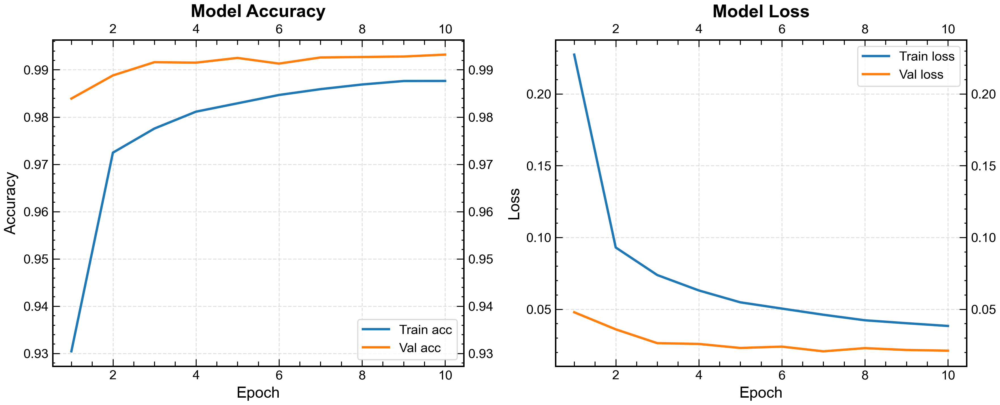

313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step


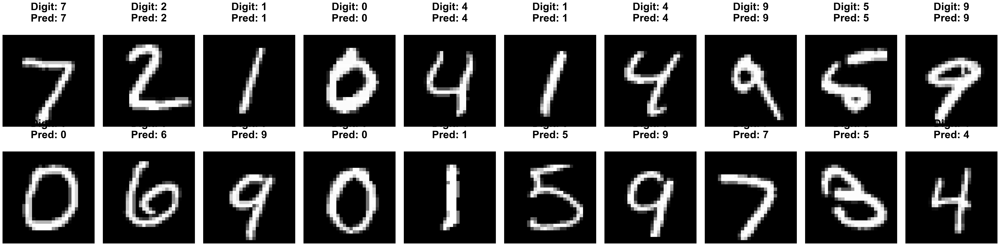

In [34]:
plot_cnn(history_CNN, model_CNN, X_test, Y_test)



The training and validation curves indicate that the CNN is learning effectively and generalizing well to unseen data.  
- **Accuracy**: Both training and validation accuracy increase steadily, with validation accuracy reaching over **99%** after 10 epochs. The validation accuracy is consistently slightly higher than the training accuracy, which suggests that dropout and other regularization techniques are working properly.  
- **Loss**: Both training and validation losses decrease, with validation loss remaining below the training loss. This behavior indicates stable convergence and no clear signs of overfitting.  

As an additional check, the model was used to predict the **first 20 digits of the MNIST test set** (not seen during training). All predictions were **correct**, further confirming the strong generalization ability of the network.



<h2><span style="color:darkviolet">Testing on Custom Data: GIMP-generated Digits</span></h2>

To further evaluate the robustness of the trained CNN, we tested the model on a custom dataset of 10 digits (0–9) created using the GIMP image editor. These images were designed to mimic the MNIST format ($28 \times 28$ pixels, grayscale) but were drawn with a personal handwriting style.


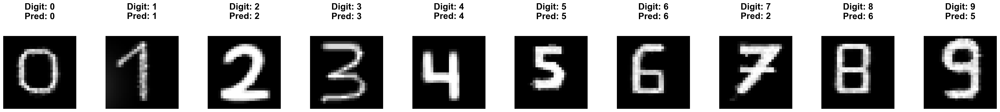

In [36]:

from PIL import Image
import os

file_list = [ "0.png","1.png", "2.png", "3.png", "4.png", "5.png", "6.png", "7.png", "8.png", "9.png"]   

fig, axes = plt.subplots(1, len(file_list), figsize=(20, 4))
plt.subplots_adjust(wspace=0.4)

if len(file_list) == 1:
    axes = [axes]

for idx, digit_filename in enumerate(file_list):
    try:
        
        digit_in = Image.open(f'number_pictures/{digit_filename}').convert('L')
        ydim, xdim = digit_in.size
        data = np.array(digit_in) / 255.0 
        
        input_data = data.reshape(1, xdim, ydim, 1)
        pred = model_CNN.predict(input_data, verbose=0)
        predicted_digit = np.argmax(pred)
        confidence = np.max(pred)
        
        axes[idx].imshow(data, cmap='gray')
        axes[idx].set_title(f"Digit: {digit_filename.split('.')[0]}\nPred: {predicted_digit}", 
                          fontsize=10)
        axes[idx].axis('off')
        
    except Exception as e:
        print(f"Error processing {digit_filename}: {str(e)}")
        axes[idx].axis('off')

plt.show()


While the CNN demonstrated high accuracy on most digits, three specific misclassifications occurred, providing valuable insights into the model's limitations:

- **Digit 7 → Predicted as 2**: The misclassification of "7" as "2" is particularly interesting. In many European handwriting styles, a "7" includes a **horizontal middle bar**. However, the MNIST dataset (largely based on North American handwriting) typically features "7"s without this bar. To a CNN trained on MNIST, this middle bar might be interpreted as the horizontal base or the central curve of a "2", highlighting the model's reliance on specific local patterns rather than abstract digit concepts.

- **Digit 8 → Predicted as 6**: The failure to recognize the digit "8" suggests a sensitivity to **topological features**. In the custom sample, the loops of the "8" might have been drawn with a thickness or symmetry that the network lacks in its training distribution. If the upper loop is slightly smaller or less defined, the CNN may prioritize the lower curve, leading to a "6" classification, which shares similar local curvature.

- **Digit 9 → Predicted as 5**: The custom "9" was misclassified as a "5". A plausible explanation lies in the lower tail of the digit. The MNIST dataset predominantly features "9"s with straight or very slightly curved tails. The presence of a more pronounced or uniquely angled tail in the GIMP version likely confused the convolutional filters, causing the network to misinterpret the global structure as a "5".

These errors demonstrate that the CNN has not learned a "universal" concept of a digit, but rather a high-dimensional mapping specific to the **MNIST training distribution**. This is a classic example of a Distribution Shift: when the test data (GIMP digits) comes from a slightly different "style" than the training data, performance drops even if the images are clear to a human eye.

CNNs are exceptionally good at identifying local patterns (edges, loops, intersections). When you add a "middle bar" to a 7, you are adding a local feature that the network has been trained to associate with other digits (like 2). The model gives more "weight" to that specific local feature than to the overall "7-like" shape.

Overall, this experiment proves that while CNNs are powerful, their generalization is bound by the variety of the data they have seen. A "perfect" score on the MNIST test set does not guarantee success in the real world.